# Imports

In [1]:
import torch
import numpy as np
from torchvision import transforms
from PIL import Image as PilImage
from matplotlib import pyplot as plt

from omnixai.preprocessing.image import Resize
from omnixai.data.image import Image
from omnixai.explainers.vision import VisionExplainer
from omnixai.visualization.dashboard import Dashboard
from omnixai.explainers.vision.specific.gradcam.pytorch.gradcam import GradCAM

from Exp.model import ResNet18, Vgg16

2023-05-02 16:40:35.145360: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-02 16:40:36.085366: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/vuong.nguyen/.conda/envs/tf/lib/python3.9/site-packages/cv2/../../lib64:/usr/local/cudnn/11.2-v8.1.0/cuda/lib64:/usr/local/cuda-11.2/lib64:/home/vuong.nguyen/.conda/envs/tf/lib/:/home/vuong.nguyen/.conda/envs/tf/lib/python3.9/site-packages/nvidia/cudnn/lib
2023-05-02 16:40:36.085431: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'l

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# Explainable AI

## Highway

### Origin

In [3]:
hw_vgg16_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/Origin/Vgg16"

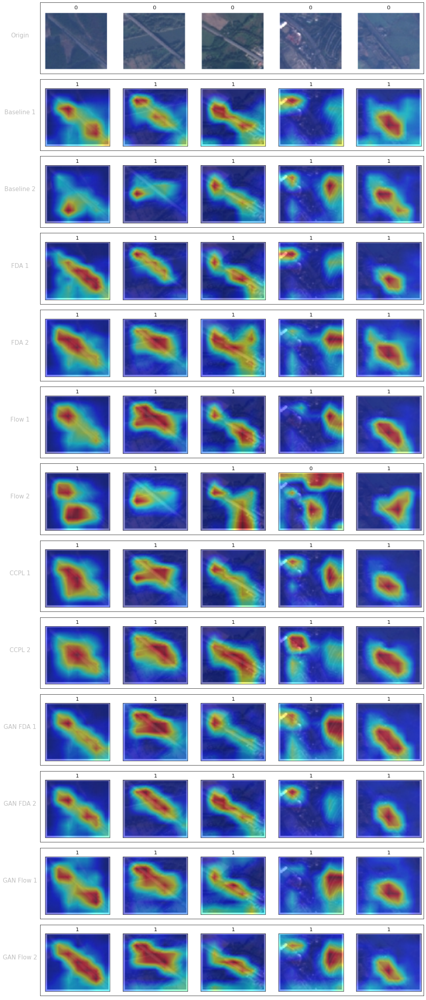

In [4]:
fig = plt.figure(figsize=(15,35))
rows = ['Origin', 'Baseline 1', 'Baseline 2', 'FDA 1', 'FDA 2', 'Flow 1', 'Flow 2', 'CCPL 1', 'CCPL 2', 'GAN FDA 1', 'GAN FDA 2', 'GAN Flow 1', 'GAN Flow 2']
for num in range(1,14):
    if num == 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/Origin/hw.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

    elif num > 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"{hw_vgg16_path}/GradCAM/res_{num-1}.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

fig.tight_layout()
plt.show()

### NST

In [5]:
hw_vgg16_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/NST/Vgg16"

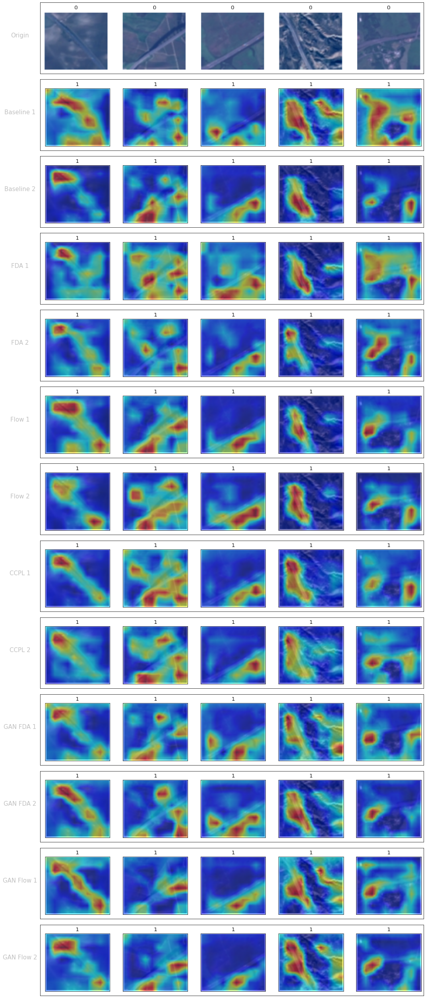

In [6]:
fig = plt.figure(figsize=(15,35))
rows = ['Origin', 'Baseline 1', 'Baseline 2', 'FDA 1', 'FDA 2', 'Flow 1', 'Flow 2', 'CCPL 1', 'CCPL 2', 'GAN FDA 1', 'GAN FDA 2', 'GAN Flow 1', 'GAN Flow 2']
for num in range(1,14):
    if num == 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/NST/hw.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

    elif num > 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"{hw_vgg16_path}/GradCAM/res_{num-1}.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

fig.tight_layout()
plt.show()

### GAN + NST

In [7]:
hw_vgg16_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/GAN_NST/Vgg16"

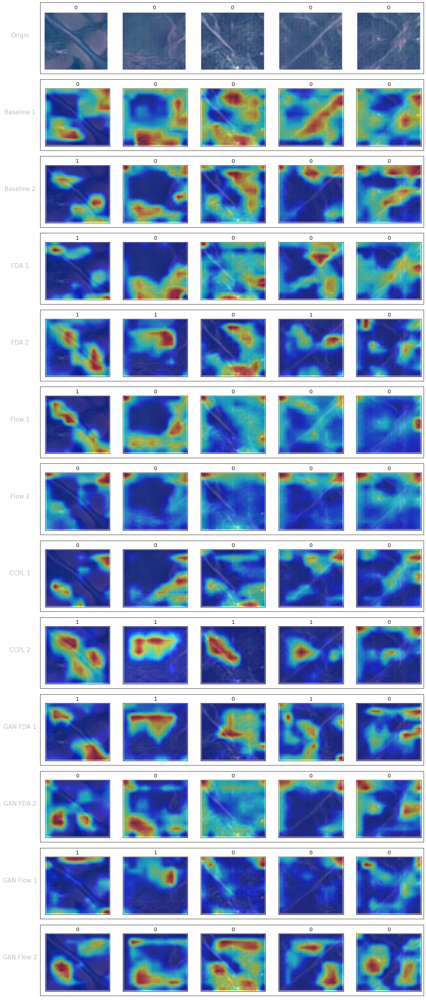

In [8]:
fig = plt.figure(figsize=(15,35))
rows = ['Origin', 'Baseline 1', 'Baseline 2', 'FDA 1', 'FDA 2', 'Flow 1', 'Flow 2', 'CCPL 1', 'CCPL 2', 'GAN FDA 1', 'GAN FDA 2', 'GAN Flow 1', 'GAN Flow 2']
for num in range(1,14):
    if num == 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_HW/GAN_NST/hw.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

    elif num > 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"{hw_vgg16_path}/GradCAM/res_{num-1}.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

fig.tight_layout()
plt.show()

## River

### Origin

In [9]:
rv_vgg16_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/Origin/Vgg16"

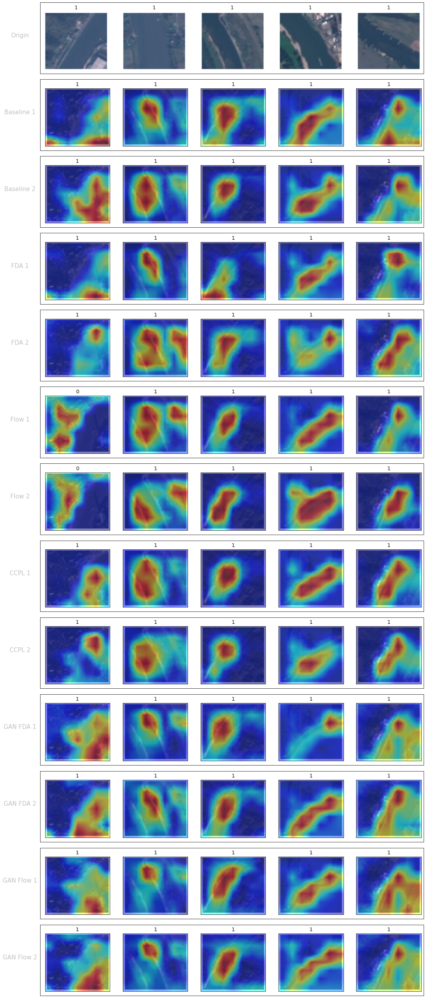

In [10]:
fig = plt.figure(figsize=(15,35))
rows = ['Origin', 'Baseline 1', 'Baseline 2', 'FDA 1', 'FDA 2', 'Flow 1', 'Flow 2', 'CCPL 1', 'CCPL 2', 'GAN FDA 1', 'GAN FDA 2', 'GAN Flow 1', 'GAN Flow 2']
for num in range(1,14):
    if num == 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/Origin/rv.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

    elif num > 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"{rv_vgg16_path}/GradCAM/res_{num-1}.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

fig.tight_layout()
plt.show()

### NST

In [11]:
rv_vgg16_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/NST/Vgg16"

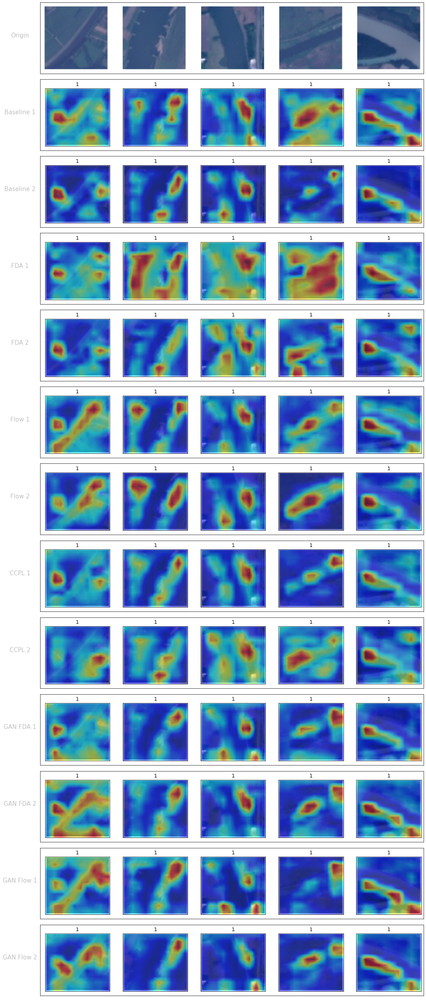

In [12]:
fig = plt.figure(figsize=(15,35))
rows = ['Origin', 'Baseline 1', 'Baseline 2', 'FDA 1', 'FDA 2', 'Flow 1', 'Flow 2', 'CCPL 1', 'CCPL 2', 'GAN FDA 1', 'GAN FDA 2', 'GAN Flow 1', 'GAN Flow 2']
for num in range(1,14):
    if num == 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/NST/rv.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

    elif num > 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"{rv_vgg16_path}/GradCAM/res_{num-1}.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

fig.tight_layout()
plt.show()

### GAN + NST

In [13]:
rv_vgg16_path = "/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/GAN_NST/Vgg16"

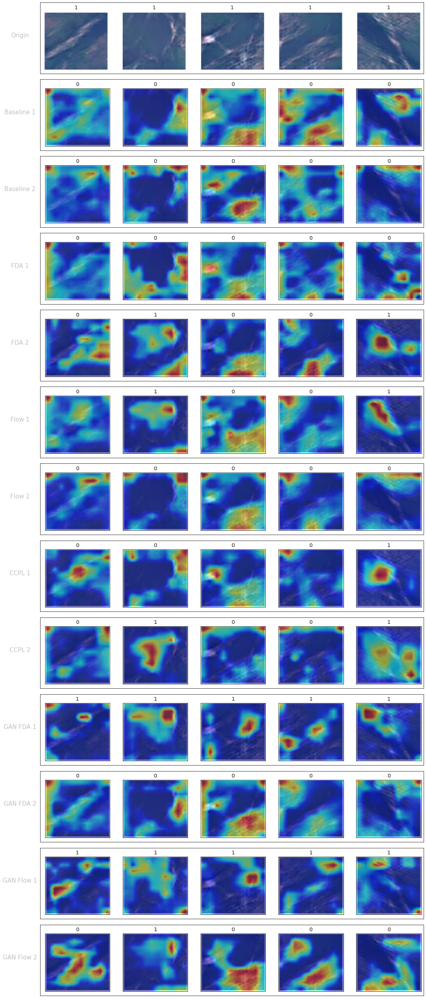

In [14]:
fig = plt.figure(figsize=(15,35))
rows = ['Origin', 'Baseline 1', 'Baseline 2', 'FDA 1', 'FDA 2', 'Flow 1', 'Flow 2', 'CCPL 1', 'CCPL 2', 'GAN FDA 1', 'GAN FDA 2', 'GAN Flow 1', 'GAN Flow 2']
for num in range(1,14):
    if num == 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias in EuroSAT/X_RV/GAN_NST/rv.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

    elif num > 1:
        ax = fig.add_subplot(13, 1, num)
        img = PilImage.open(f"{rv_vgg16_path}/GradCAM/res_{num-1}.png")
        ax.imshow(img, aspect='auto')
        ax.set_ylabel(rows[num-1], rotation=0, fontsize=15, labelpad=50)
        ax.yaxis.label.set_color('silver')
        ax.set_xticks([])
        ax.set_yticks([])

fig.tight_layout()
plt.show()